<a href="https://colab.research.google.com/github/OJB-Quantum/Notebooks-for-Ideas/blob/main/Kelvin_Wave_Numerical_Simulation_with_CuPy_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Authored by Onri Jay Benally (2026)

Open Access (CC-BY-4.0)

In [4]:
!uv pip install --system -q "cupy-cuda12x>=14.0,<15.0" "matplotlib>=3.8" pillow


Adaptive Kelvin wake solver
  GPU memory                  : 18.82 / 22.03 GiB free
  Physical regime             : deep-water gravity
  Complexity                  : moderate (1.841)
  Length Froude number        : 0.78206
  Depth Froude number         : 0.21418
  Bond number                 : 306562
  Capillary length            : 2.70914 mm
  Stationary wavelengths      : 23.058 m
  FFT grid                    : 8192 × 4096
  Cell spacing                : 0.045353 × 0.056442 m
  Shortest-wave resolution    : 408.52 points
  Precision                   : float64
  FFT padding factor          : 2.578
  Boundary expansions         : 2
  Boundary field ratio        : 4.517e-02
  Boundary target met         : False
  Sparse target fraction      : 0.160
  Sparse actual fraction      : 0.022
  Sparse active nodes         : 750,000
  Graph connectivity          : 8-neighbor
  Graph lambda                : 0.05000
  Graph correction L2 ratio   : 6.579e-04
  Max local graph correction  : 9.23

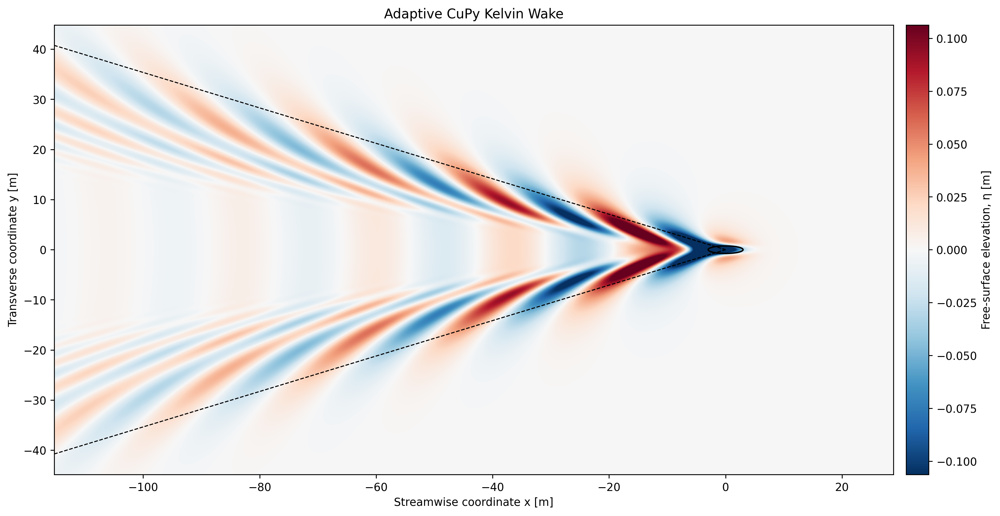

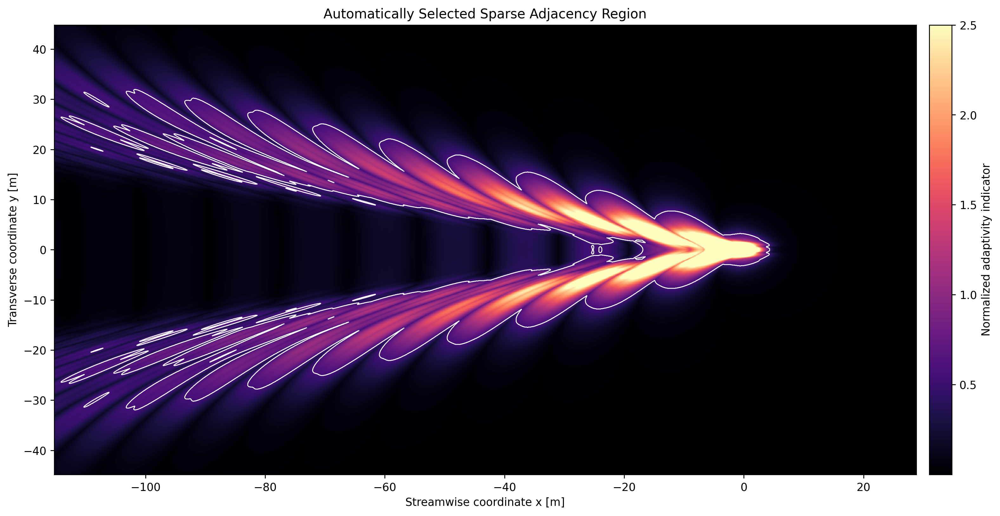

Indexed Kelvin wake GIF
  Path                : /content/kelvin_wake_uint8.gif
  Encoded frame type  : uint8 indexed palette
  GPU animation type  : float32 / complex64
  Frames              : 48
  Target frame rate   : 12 FPS
  Duration            : 4.000 s
  Raster size         : 795 × 398 px
  Downsample stride   : 4
  File size           : 5.033 MiB



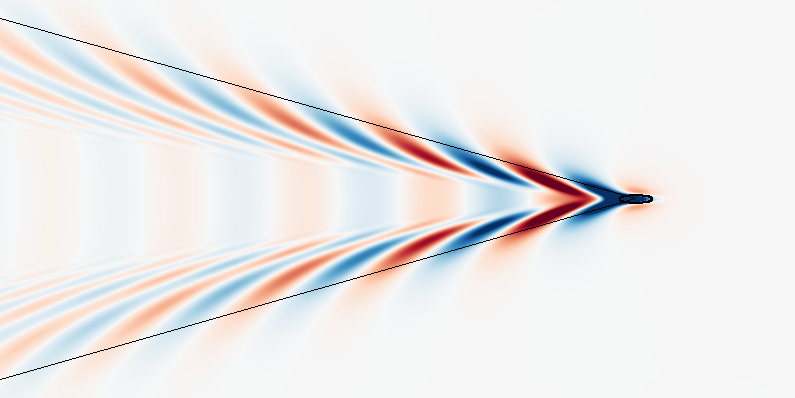

In [6]:
"""Simulate an adaptive Kelvin wake with CuPy and sparse graph correction.

The solver combines a Fourier-domain free-surface calculation with an
adaptive adjacency graph. A spectral stage resolves the nonlocal water-wave
dispersion relation, complemented by a sparse graph correction constructed
around dynamically selected wake structures.
"""

import gc
import inspect
import math
from dataclasses import dataclass, replace
from pathlib import Path
from typing import Final

import cupy as cp
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from cupyx.scipy import sparse as cpx_sparse
from cupyx.scipy.sparse import linalg as cpx_linalg
from IPython.display import Image as IPythonImage
from IPython.display import display
from matplotlib.patches import Ellipse
from PIL import GifImagePlugin, Image, ImageDraw


# -----------------------------------------------------------------------------
# Physical control knobs
# -----------------------------------------------------------------------------

AUTO_ADAPT: Final[bool] = True

VESSEL_SPEED_M_S: Final[float] = 6.0

SOURCE_LENGTH_M: Final[float] = 6.0
SOURCE_WIDTH_M: Final[float] = 1.5
SOURCE_ANGLE_DEG: Final[float] = 0.0
PRESSURE_PEAK_PA: Final[float] = 2_500.0

WATER_DEPTH_M: Final[float] = 80.0
WATER_DENSITY_KG_M3: Final[float] = 1_000.0
SURFACE_TENSION_N_M: Final[float] = 0.072
GRAVITY_M_S2: Final[float] = 9.81

PHYSICS_MODE: Final[str] = "auto"
DEPTH_MODE: Final[str] = "auto"
PRECISION_MODE: Final[str] = "auto"


# -----------------------------------------------------------------------------
# Adaptive numerical control knobs
# -----------------------------------------------------------------------------

SPARSE_CORRECTION_ENABLED: Final[bool] = True
GRAPH_CONNECTIVITY: Final[int] = 8
MAX_ACTIVE_NODES: Final[int] = 750_000
MAX_RELATIVE_GRAPH_CORRECTION: Final[float] = 0.12

MASK_HYSTERESIS_ENABLED: Final[bool] = True
HYSTERESIS_SEED_RATIO: Final[float] = 0.45
MASK_GROWTH_STEPS: Final[int] = 5

GPU_MEMORY_FRACTION: Final[float] = 0.42

AUTO_EXPAND_DOMAIN: Final[bool] = True
BOUNDARY_FIELD_TARGET: Final[float] = 0.01
MAX_BOUNDARY_EXPANSIONS: Final[int] = 2
BOUNDARY_EXPANSION_FACTOR: Final[float] = 1.25

RUN_GRID_CONVERGENCE_AUDIT: Final[bool] = True
GRID_CONVERGENCE_TARGET: Final[float] = 0.03

RADIATION_STRENGTH: Final[float | None] = None
MANUAL_ACTIVE_FRACTION: Final[float | None] = None
MANUAL_GRAPH_LAMBDA: Final[float | None] = None
MANUAL_NX: Final[int | None] = None
MANUAL_NY: Final[int | None] = None


# -----------------------------------------------------------------------------
# Plot control knobs
# -----------------------------------------------------------------------------

SHOW_ADAPTIVITY_DIAGNOSTIC: Final[bool] = True
SHOW_CLASSIC_KELVIN_RAYS: Final[bool] = True

FIGURE_DPI: Final[int] = 250
PLOT_PERCENTILE_LIMIT: Final[float] = 99.5


# -----------------------------------------------------------------------------
# GIF control knobs
# -----------------------------------------------------------------------------

RENDER_GIF: Final[bool] = True
GIF_FPS: Final[int] = 12
GIF_DURATION_S: Final[float | None] = 4.0
GIF_OUTPUT_PATH: Final[str] = "/content/kelvin_wake_uint8.gif"
GIF_MAX_WIDTH_PX: Final[int] = 960
GIF_MAX_HEIGHT_PX: Final[int] = 540
GIF_LOOP: Final[int] = 0
GIF_COLORMAP: Final[str] = "RdBu_r"
GIF_PERCENTILE_LIMIT: Final[float] = 99.5
GIF_DRAW_SOURCE: Final[bool] = True
GIF_DRAW_KELVIN_RAYS: Final[bool] = True
GIF_DISPLAY_IN_COLAB: Final[bool] = True
GIF_KEEP_SOURCE_IN_VIEW: Final[bool] = True


@dataclass(frozen=True)
class SimulationConfig:
    """Store physical inputs and numerical policies."""

    speed: float = VESSEL_SPEED_M_S

    source_length: float = SOURCE_LENGTH_M
    source_width: float = SOURCE_WIDTH_M
    source_angle_deg: float = SOURCE_ANGLE_DEG
    pressure_peak: float = PRESSURE_PEAK_PA

    water_depth: float = WATER_DEPTH_M
    density: float = WATER_DENSITY_KG_M3
    surface_tension: float = SURFACE_TENSION_N_M
    gravity: float = GRAVITY_M_S2

    physics_mode: str = PHYSICS_MODE
    depth_mode: str = DEPTH_MODE
    precision_mode: str = PRECISION_MODE

    auto_adapt: bool = AUTO_ADAPT
    sparse_correction: bool = SPARSE_CORRECTION_ENABLED
    graph_connectivity: int = GRAPH_CONNECTIVITY
    max_active_nodes: int = MAX_ACTIVE_NODES
    max_relative_graph_correction: float = MAX_RELATIVE_GRAPH_CORRECTION

    mask_hysteresis: bool = MASK_HYSTERESIS_ENABLED
    hysteresis_seed_ratio: float = HYSTERESIS_SEED_RATIO
    mask_growth_steps: int = MASK_GROWTH_STEPS

    gpu_memory_fraction: float = GPU_MEMORY_FRACTION

    auto_expand_domain: bool = AUTO_EXPAND_DOMAIN
    boundary_field_target: float = BOUNDARY_FIELD_TARGET
    max_boundary_expansions: int = MAX_BOUNDARY_EXPANSIONS
    boundary_expansion_factor: float = BOUNDARY_EXPANSION_FACTOR

    run_grid_convergence_audit: bool = RUN_GRID_CONVERGENCE_AUDIT
    grid_convergence_target: float = GRID_CONVERGENCE_TARGET

    radiation_strength: float | None = RADIATION_STRENGTH
    manual_active_fraction: float | None = MANUAL_ACTIVE_FRACTION
    manual_graph_lambda: float | None = MANUAL_GRAPH_LAMBDA

    manual_nx: int | None = MANUAL_NX
    manual_ny: int | None = MANUAL_NY


@dataclass(frozen=True)
class AnimationConfig:
    """Store indexed-GIF rendering policies."""

    enabled: bool = RENDER_GIF
    fps: int = GIF_FPS
    duration_s: float | None = GIF_DURATION_S
    output_path: str = GIF_OUTPUT_PATH
    max_width_px: int = GIF_MAX_WIDTH_PX
    max_height_px: int = GIF_MAX_HEIGHT_PX
    loop: int = GIF_LOOP
    colormap: str = GIF_COLORMAP
    percentile_limit: float = GIF_PERCENTILE_LIMIT
    draw_source: bool = GIF_DRAW_SOURCE
    draw_kelvin_rays: bool = GIF_DRAW_KELVIN_RAYS
    display_in_colab: bool = GIF_DISPLAY_IN_COLAB
    keep_source_in_view: bool = GIF_KEEP_SOURCE_IN_VIEW


@dataclass(frozen=True)
class AdaptivePlan:
    """Contain parameters selected by the automatic adaptation controller."""

    regime_name: str

    finite_depth: bool
    capillary: bool

    froude_length: float
    froude_depth: float
    bond_number: float
    capillary_length: float

    stationary_wavelengths: tuple[float, ...]
    reference_wavelength: float

    complexity_score: float
    complexity_label: str

    points_per_wavelength: int
    target_spacing: float
    pad_factor: float

    active_fraction: float
    graph_lambda: float
    graph_dilation_passes: int

    cg_rtol: float
    cg_maxiter: int

    radiation_epsilon: float
    precision_name: str

    nx: int
    ny: int

    x_min: float
    x_max: float
    y_min: float
    y_max: float

    view_x_min: float
    view_x_max: float
    view_y_min: float
    view_y_max: float


@dataclass(frozen=True)
class GraphSolveStats:
    """Contain sparse graph solver diagnostics."""

    cg_info: int
    cg_iterations: int
    active_nodes: int
    relative_residual: float
    correction_l2_ratio: float
    max_local_correction_ratio: float
    blend_factor: float


@dataclass(frozen=True)
class NumericalDiagnostics:
    """Contain numerical quality metrics for a completed simulation."""

    boundary_field_ratio: float
    boundary_target_met: bool
    boundary_expansions: int

    symmetry_l2_error: float | None
    max_surface_slope_p995: float
    hydrostatic_amplitude_ratio: float

    actual_active_fraction: float
    points_per_shortest_wavelength: float

    estimated_wake_half_angle_deg: float | None
    grid_convergence_l2_error: float | None
    grid_convergence_target_met: bool | None


@dataclass
class WakeResult:
    """Contain solved wake fields and numerical diagnostics."""

    x: cp.ndarray
    y: cp.ndarray

    eta_spectral: cp.ndarray
    eta_refined: cp.ndarray

    pressure: cp.ndarray
    indicator: cp.ndarray
    active_mask: cp.ndarray

    plan: AdaptivePlan
    graph_stats: GraphSolveStats
    diagnostics: NumericalDiagnostics


class AdaptiveKelvinWakeSolver:
    """Solve Kelvin-type wakes with spectral and sparse adjacency methods.

    A global Fourier solve evaluates the linear water-wave response to an
    elliptical moving pressure footprint. The selected dispersion relation
    can include finite-depth and capillary corrections.

    Wake regions carrying appreciable elevation, gradient, or curvature are
    detected after the spectral solve. Hysteretic graph growth connects weak
    structures to strong seeds before sparse refinement is assembled.

    Eight-neighbor adjacency improves directional isotropy for oblique wave
    crests. The resulting weighted graph Laplacian is regularized with a
    Jacobi-preconditioned conjugate-gradient solve.
    """

    KELVIN_HALF_ANGLE_DEG: Final[float] = math.degrees(
        math.asin(1.0 / 3.0)
    )

    def __init__(self, config: SimulationConfig) -> None:
        """Initialize the simulation.

        Args:
            config: Physical and numerical configuration.
        """
        self.config = config
        self._validate_config()

        (
            self.free_gpu_bytes,
            self.total_gpu_bytes,
        ) = cp.cuda.runtime.memGetInfo()

        self.plan = self._build_adaptive_plan()
        self._set_precision_types()

    def _set_precision_types(self) -> None:
        """Select CuPy real and complex scalar types from the adaptive plan."""
        if self.plan.precision_name == "float32":
            self.real_dtype = cp.float32
            self.complex_dtype = cp.complex64
        else:
            self.real_dtype = cp.float64
            self.complex_dtype = cp.complex128

    def _validate_config(self) -> None:
        """Check physical inputs and numerical policy values."""
        cfg = self.config

        positive_values = {
            "speed": cfg.speed,
            "source_length": cfg.source_length,
            "source_width": cfg.source_width,
            "pressure_peak": cfg.pressure_peak,
            "density": cfg.density,
            "gravity": cfg.gravity,
            "max_active_nodes": float(cfg.max_active_nodes),
            "gpu_memory_fraction": cfg.gpu_memory_fraction,
            "boundary_field_target": cfg.boundary_field_target,
            "boundary_expansion_factor": cfg.boundary_expansion_factor,
            "grid_convergence_target": cfg.grid_convergence_target,
        }

        for name, value in positive_values.items():
            if value <= 0.0:
                raise ValueError(
                    f"{name} must be positive. Received {value}."
                )

        if cfg.surface_tension < 0.0:
            raise ValueError(
                "surface_tension must be zero or positive."
            )

        if (0.05 <= cfg.gpu_memory_fraction <= 0.80) is False:
            raise ValueError(
                "gpu_memory_fraction must lie from 0.05 to 0.80."
            )

        if cfg.graph_connectivity not in {4, 8}:
            raise ValueError(
                "graph_connectivity must equal 4 or 8."
            )

        if (0.0 < cfg.hysteresis_seed_ratio <= 1.0) is False:
            raise ValueError(
                "hysteresis_seed_ratio must lie in (0, 1]."
            )

        if cfg.mask_growth_steps < 0:
            raise ValueError(
                "mask_growth_steps must be zero or positive."
            )

        if cfg.max_boundary_expansions < 0:
            raise ValueError(
                "max_boundary_expansions must be zero or positive."
            )

        if cfg.boundary_expansion_factor <= 1.0:
            raise ValueError(
                "boundary_expansion_factor must exceed 1.0."
            )

        valid_physics = {
            "auto",
            "gravity",
            "gravity_capillary",
        }
        if cfg.physics_mode not in valid_physics:
            raise ValueError(
                f"Unsupported physics mode {cfg.physics_mode!r}."
            )

        valid_depth = {
            "auto",
            "deep",
            "finite",
        }
        if cfg.depth_mode not in valid_depth:
            raise ValueError(
                f"Unsupported depth mode {cfg.depth_mode!r}."
            )

        valid_precision = {
            "auto",
            "float32",
            "float64",
        }
        if cfg.precision_mode not in valid_precision:
            raise ValueError(
                f"Unsupported precision mode {cfg.precision_mode!r}."
            )

    @staticmethod
    def _validate_animation_config(animation: AnimationConfig) -> None:
        """Check indexed-GIF rendering policies.

        Args:
            animation: GIF configuration to check.
        """
        if animation.fps <= 0:
            raise ValueError(
                "GIF fps must be positive."
            )

        if animation.duration_s is not None and animation.duration_s <= 0.0:
            raise ValueError(
                "GIF duration must be positive when supplied."
            )

        if animation.max_width_px < 64 or animation.max_height_px < 64:
            raise ValueError(
                "GIF dimensions must each be at least 64 pixels."
            )

        if (50.0 <= animation.percentile_limit <= 100.0) is False:
            raise ValueError(
                "GIF percentile limit must lie from 50 to 100."
            )

        if Path(animation.output_path).suffix.lower() != ".gif":
            raise ValueError(
                "GIF output_path must end with .gif."
            )

    @staticmethod
    def _next_power_of_two(value: int) -> int:
        """Return the smallest power of two containing the requested size."""
        if value <= 1:
            return 1

        return 1 << (value - 1).bit_length()

    @staticmethod
    def _clear_unused_gpu_memory() -> None:
        """Release cached GPU and pinned-memory blocks that lack live owners."""
        gc.collect()
        cp.get_default_memory_pool().free_all_blocks()
        cp.get_default_pinned_memory_pool().free_all_blocks()

    def _infer_regime(
        self,
    ) -> tuple[bool, bool, float, float, float, float]:
        """Infer physical regime from dimensionless scale parameters.

        Returns:
            A tuple containing finite-depth activation, capillary activation,
            length Froude number, depth Froude number, Bond number, and
            capillary length.
        """
        cfg = self.config

        gamma_safe = max(
            cfg.surface_tension,
            1.0e-16,
        )

        capillary_length = math.sqrt(
            gamma_safe / (cfg.density * cfg.gravity)
        )

        minimum_source_scale = min(
            cfg.source_length,
            cfg.source_width,
        )

        bond_number = (
            cfg.density
            * cfg.gravity
            * minimum_source_scale**2
            / gamma_safe
        )

        froude_length = (
            cfg.speed
            / math.sqrt(
                cfg.gravity * cfg.source_length
            )
        )

        if (
            math.isfinite(cfg.water_depth)
            and cfg.water_depth > 0.0
        ):
            froude_depth = (
                cfg.speed
                / math.sqrt(
                    cfg.gravity * cfg.water_depth
                )
            )
        else:
            froude_depth = 0.0

        if cfg.physics_mode == "gravity_capillary":
            capillary = True
        elif cfg.physics_mode == "gravity":
            capillary = False
        else:
            capillary = (
                cfg.surface_tension > 0.0
                and bond_number < 100.0
            )

        gravity_wavelength = (
            2.0
            * math.pi
            * cfg.speed**2
            / cfg.gravity
        )

        depth_reference = max(
            min(
                gravity_wavelength,
                4.0 * cfg.source_length,
            ),
            cfg.source_width,
        )

        k_reference = (
            2.0
            * math.pi
            / depth_reference
        )

        if math.isfinite(cfg.water_depth):
            kh_reference = (
                k_reference
                * cfg.water_depth
            )
        else:
            kh_reference = math.inf

        if cfg.depth_mode == "finite":
            finite_depth = True
        elif cfg.depth_mode == "deep":
            finite_depth = False
        else:
            finite_depth = (
                math.isfinite(cfg.water_depth)
                and kh_reference < 3.0
            )

        return (
            finite_depth,
            capillary,
            froude_length,
            froude_depth,
            bond_number,
            capillary_length,
        )

    def _stationary_wavelengths(
        self,
        finite_depth: bool,
        capillary: bool,
    ) -> tuple[float, ...]:
        """Estimate excitable stationary centerline wavelengths.

        The phase-speed equation c_p(k) = U is sampled on a logarithmic
        wavenumber grid. Gravity and capillary branches can consequently be
        identified without another host-side root-finding dependency.

        Roots whose Gaussian forcing amplitude is negligible are discarded.

        Args:
            finite_depth: Activate finite-depth dispersion.
            capillary: Activate the surface-tension term.

        Returns:
            Tuple of relevant stationary wavelengths in meters.
        """
        cfg = self.config

        smallest_scale = min(
            cfg.source_length,
            cfg.source_width,
        )

        largest_scale = max(
            cfg.source_length,
            cfg.source_width,
        )

        capillary_length = math.sqrt(
            max(cfg.surface_tension, 1.0e-16)
            / (cfg.density * cfg.gravity)
        )

        k_min = (
            2.0
            * math.pi
            / max(
                2_000.0 * largest_scale,
                1.0e-6,
            )
        )

        resolution_scale = (
            smallest_scale / 40.0
        )

        if capillary:
            resolution_scale = min(
                resolution_scale,
                capillary_length / 8.0,
            )

        k_max = (
            2.0
            * math.pi
            / max(
                resolution_scale,
                1.0e-6,
            )
        )

        k_values = np.logspace(
            math.log10(k_min),
            math.log10(k_max),
            16_000,
        )

        if (
            finite_depth
            and math.isfinite(cfg.water_depth)
        ):
            depth_factor = np.tanh(
                k_values * cfg.water_depth
            )
        else:
            depth_factor = np.ones_like(
                k_values
            )

        if capillary:
            capillary_speed_term = (
                cfg.surface_tension
                * k_values
                / cfg.density
            )
        else:
            capillary_speed_term = np.zeros_like(
                k_values
            )

        phase_speed_squared = (
            (
                cfg.gravity / k_values
                + capillary_speed_term
            )
            * depth_factor
        )

        phase_speed = np.sqrt(
            np.maximum(
                phase_speed_squared,
                0.0,
            )
        )

        residual = (
            phase_speed
            - cfg.speed
        )

        sign_changes = (
            residual[:-1]
            * residual[1:]
            <= 0.0
        )

        indices = np.flatnonzero(
            sign_changes
        )

        roots: list[float] = []

        sigma_x = (
            cfg.source_length
            / 2.354820045
        )

        for index in indices:
            k_0 = k_values[index]
            k_1 = k_values[index + 1]

            r_0 = residual[index]
            r_1 = residual[index + 1]

            fraction = (
                abs(r_0)
                / max(
                    abs(r_0) + abs(r_1),
                    1.0e-30,
                )
            )

            root = math.exp(
                math.log(k_0)
                + fraction
                * (
                    math.log(k_1)
                    - math.log(k_0)
                )
            )

            excitation = math.exp(
                -0.5
                * (sigma_x * root) ** 2
            )

            if excitation >= 1.0e-5:
                wavelength = (
                    2.0
                    * math.pi
                    / root
                )

                roots.append(
                    wavelength
                )

        if roots:
            unique_roots = {
                round(value, 12)
                for value in roots
            }

            return tuple(
                sorted(unique_roots)
            )

        fallback = (
            2.0
            * math.pi
            * cfg.speed**2
            / cfg.gravity
        )

        return (fallback,)

    def _infer_complexity(
        self,
        finite_depth: bool,
        capillary: bool,
        froude_length: float,
        froude_depth: float,
        wavelengths: tuple[float, ...],
    ) -> tuple[float, str]:
        """Estimate the amount of numerical work required.

        Args:
            finite_depth: Finite-depth model state.
            capillary: Capillary model state.
            froude_length: Source-length Froude number.
            froude_depth: Water-depth Froude number.
            wavelengths: Excitable stationary wavelengths.

        Returns:
            Continuous complexity score and categorical label.
        """
        cfg = self.config

        aspect_ratio = (
            max(
                cfg.source_length,
                cfg.source_width,
            )
            / min(
                cfg.source_length,
                cfg.source_width,
            )
        )

        scale_separation = (
            max(wavelengths)
            / max(
                min(wavelengths),
                1.0e-12,
            )
        )

        score = 1.0

        if finite_depth:
            score += 0.75

        if capillary:
            score += 1.0

        score += (
            min(
                math.log2(
                    max(
                        aspect_ratio,
                        1.0,
                    )
                ),
                3.0,
            )
            * 0.20
        )

        score += (
            min(
                math.log10(
                    max(
                        scale_separation,
                        1.0,
                    )
                ),
                3.0,
            )
            * 0.35
        )

        score += (
            0.65
            * math.exp(
                -(
                    (
                        froude_length
                        - 1.0
                    )
                    / 0.35
                )
                ** 2
            )
        )

        if finite_depth:
            score += (
                0.80
                * math.exp(
                    -(
                        (
                            froude_depth
                            - 1.0
                        )
                        / 0.25
                    )
                    ** 2
                )
            )

        if score < 1.8:
            label = "low"
        elif score < 2.8:
            label = "moderate"
        else:
            label = "high"

        return score, label

    def _infer_domain(
        self,
        reference_wavelength: float,
        finite_depth: bool,
        froude_depth: float,
    ) -> tuple[float, float, float, float]:
        """Determine an asymmetric domain containing the downstream wake."""
        cfg = self.config

        downstream = max(
            8.0 * cfg.source_length,
            5.0 * reference_wavelength,
            12.0 * cfg.source_width,
        )

        upstream = max(
            2.5 * cfg.source_length,
            1.25 * reference_wavelength,
        )

        half_angle = math.radians(
            self.KELVIN_HALF_ANGLE_DEG
        )

        if (
            finite_depth
            and froude_depth > 1.05
        ):
            shallow_angle = math.asin(
                min(
                    1.0,
                    1.0 / froude_depth,
                )
            )

            half_angle = max(
                half_angle,
                shallow_angle,
            )

        lateral = max(
            4.0 * cfg.source_width,
            1.10
            * downstream
            * math.tan(half_angle),
            1.75 * reference_wavelength,
        )

        return (
            -downstream,
            upstream,
            -lateral,
            lateral,
        )

    @staticmethod
    def _estimated_bytes_per_cell(precision_name: str) -> int:
        """Estimate peak solver memory per grid cell."""
        if precision_name == "float32":
            return 82

        return 154

    def _fit_grid_to_memory(
        self,
        nx_target: int,
        ny_target: int,
        precision_name: str,
    ) -> tuple[int, int]:
        """Fit power-of-two FFT dimensions inside the GPU memory budget."""
        cfg = self.config

        nx = self._next_power_of_two(
            max(nx_target, 256)
        )

        ny = self._next_power_of_two(
            max(ny_target, 256)
        )

        estimated_bytes_per_cell = (
            self._estimated_bytes_per_cell(
                precision_name
            )
        )

        memory_budget = int(
            self.free_gpu_bytes
            * cfg.gpu_memory_fraction
        )

        while (
            nx
            * ny
            * estimated_bytes_per_cell
            > memory_budget
        ):
            if nx >= ny and nx > 256:
                nx //= 2
            elif ny > 256:
                ny //= 2
            else:
                raise MemoryError(
                    "The requested domain exceeds the "
                    "configured GPU memory budget."
                )

        return nx, ny

    def _build_adaptive_plan(self) -> AdaptivePlan:
        """Create the automatic simulation plan."""
        cfg = self.config

        (
            finite_depth,
            capillary,
            froude_length,
            froude_depth,
            bond_number,
            capillary_length,
        ) = self._infer_regime()

        wavelengths = (
            self._stationary_wavelengths(
                finite_depth,
                capillary,
            )
        )

        reference_wavelength = max(
            wavelengths
        )

        (
            complexity_score,
            complexity_label,
        ) = self._infer_complexity(
            finite_depth,
            capillary,
            froude_length,
            froude_depth,
            wavelengths,
        )

        regime_parts = [
            (
                "finite-depth"
                if finite_depth
                else "deep-water"
            ),
            "gravity",
        ]

        if capillary:
            regime_parts.append(
                "capillary"
            )

        regime_name = " ".join(
            regime_parts
        )

        if cfg.auto_adapt is False:
            complexity_label = "manual-medium"
            points_per_wavelength = 18
            pad_factor = 1.65
            active_fraction = 0.16
            graph_lambda = 0.050
            dilation_passes = 2
            cg_maxiter = 150

        elif complexity_label == "low":
            points_per_wavelength = 14
            pad_factor = 1.45
            active_fraction = 0.10
            graph_lambda = 0.035
            dilation_passes = 1
            cg_maxiter = 100

        elif complexity_label == "moderate":
            points_per_wavelength = 18
            pad_factor = 1.65
            active_fraction = 0.16
            graph_lambda = 0.050
            dilation_passes = 2
            cg_maxiter = 150

        else:
            points_per_wavelength = 22
            pad_factor = 1.90
            active_fraction = 0.22
            graph_lambda = 0.070
            dilation_passes = 3
            cg_maxiter = 220

        if cfg.manual_active_fraction is not None:
            active_fraction = float(
                cfg.manual_active_fraction
            )

        if cfg.manual_graph_lambda is not None:
            graph_lambda = float(
                cfg.manual_graph_lambda
            )

        (
            view_x_min,
            view_x_max,
            view_y_min,
            view_y_max,
        ) = self._infer_domain(
            reference_wavelength,
            finite_depth,
            froude_depth,
        )

        x_min = view_x_min * pad_factor
        x_max = view_x_max * pad_factor
        y_min = view_y_min * pad_factor
        y_max = view_y_max * pad_factor

        minimum_source_scale = min(
            cfg.source_length,
            cfg.source_width,
        )

        minimum_wavelength = min(
            wavelengths
        )

        target_spacing = min(
            minimum_source_scale / 10.0,
            minimum_wavelength
            / points_per_wavelength,
        )

        nx_target = math.ceil(
            (x_max - x_min)
            / target_spacing
        )

        ny_target = math.ceil(
            (y_max - y_min)
            / target_spacing
        )

        if cfg.manual_nx is not None:
            nx_target = cfg.manual_nx

        if cfg.manual_ny is not None:
            ny_target = cfg.manual_ny

        preliminary_cells = (
            self._next_power_of_two(
                nx_target
            )
            * self._next_power_of_two(
                ny_target
            )
        )

        if cfg.precision_mode == "auto":
            if preliminary_cells <= 3_000_000:
                precision_name = "float64"
            else:
                precision_name = "float32"
        else:
            precision_name = (
                cfg.precision_mode
            )

        nx, ny = self._fit_grid_to_memory(
            nx_target,
            ny_target,
            precision_name,
        )

        if cfg.radiation_strength is None:
            radiation_epsilon = (
                0.025
                * cfg.gravity
                / cfg.speed
                * (
                    1.0
                    + 0.15
                    * complexity_score
                )
            )
        else:
            radiation_epsilon = (
                cfg.radiation_strength
            )

        if precision_name == "float32":
            cg_rtol = 2.5e-5
        else:
            cg_rtol = 1.0e-7

        return AdaptivePlan(
            regime_name=regime_name,
            finite_depth=finite_depth,
            capillary=capillary,
            froude_length=froude_length,
            froude_depth=froude_depth,
            bond_number=bond_number,
            capillary_length=capillary_length,
            stationary_wavelengths=wavelengths,
            reference_wavelength=reference_wavelength,
            complexity_score=complexity_score,
            complexity_label=complexity_label,
            points_per_wavelength=points_per_wavelength,
            target_spacing=target_spacing,
            pad_factor=pad_factor,
            active_fraction=active_fraction,
            graph_lambda=graph_lambda,
            graph_dilation_passes=dilation_passes,
            cg_rtol=cg_rtol,
            cg_maxiter=cg_maxiter,
            radiation_epsilon=radiation_epsilon,
            precision_name=precision_name,
            nx=nx,
            ny=ny,
            x_min=x_min,
            x_max=x_max,
            y_min=y_min,
            y_max=y_max,
            view_x_min=view_x_min,
            view_x_max=view_x_max,
            view_y_min=view_y_min,
            view_y_max=view_y_max,
        )

    def _expanded_plan_for_boundary(
        self,
        plan: AdaptivePlan,
    ) -> AdaptivePlan | None:
        """Expand FFT padding while preserving approximately the same spacing.

        Args:
            plan: Current adaptive plan.

        Returns:
            Expanded plan, or None if the memory budget would force a
            meaningful loss of spatial resolution.
        """
        cfg = self.config

        new_pad = (
            plan.pad_factor
            * cfg.boundary_expansion_factor
        )

        x_min = plan.view_x_min * new_pad
        x_max = plan.view_x_max * new_pad
        y_min = plan.view_y_min * new_pad
        y_max = plan.view_y_max * new_pad

        dx_old = (
            plan.x_max
            - plan.x_min
        ) / plan.nx

        dy_old = (
            plan.y_max
            - plan.y_min
        ) / plan.ny

        nx_target = math.ceil(
            (x_max - x_min)
            / dx_old
        )

        ny_target = math.ceil(
            (y_max - y_min)
            / dy_old
        )

        try:
            nx, ny = self._fit_grid_to_memory(
                nx_target,
                ny_target,
                plan.precision_name,
            )
        except MemoryError:
            return None

        dx_new = (
            x_max
            - x_min
        ) / nx

        dy_new = (
            y_max
            - y_min
        ) / ny

        if (
            dx_new > 1.08 * dx_old
            or dy_new > 1.08 * dy_old
        ):
            return None

        return replace(
            plan,
            pad_factor=new_pad,
            nx=nx,
            ny=ny,
            x_min=x_min,
            x_max=x_max,
            y_min=y_min,
            y_max=y_max,
        )

    def _coordinate_vectors(
        self,
        plan: AdaptivePlan | None = None,
    ) -> tuple[
        cp.ndarray,
        cp.ndarray,
        float,
        float,
    ]:
        """Create GPU coordinate arrays and grid spacings.

        Args:
            plan: Optional plan override used by convergence audits.

        Returns:
            Streamwise coordinates, transverse coordinates, dx, and dy.
        """
        active_plan = (
            self.plan
            if plan is None
            else plan
        )

        x = cp.linspace(
            active_plan.x_min,
            active_plan.x_max,
            active_plan.nx,
            endpoint=False,
            dtype=self.real_dtype,
        )

        y = cp.linspace(
            active_plan.y_min,
            active_plan.y_max,
            active_plan.ny,
            endpoint=False,
            dtype=self.real_dtype,
        )

        dx = (
            active_plan.x_max
            - active_plan.x_min
        ) / active_plan.nx

        dy = (
            active_plan.y_max
            - active_plan.y_min
        ) / active_plan.ny

        return (
            x,
            y,
            float(dx),
            float(dy),
        )

    def _pressure_field(
        self,
        x: cp.ndarray,
        y: cp.ndarray,
    ) -> cp.ndarray:
        """Evaluate an oriented Gaussian surface-pressure footprint."""
        cfg = self.config

        angle = math.radians(
            cfg.source_angle_deg
        )

        cos_angle = math.cos(
            angle
        )

        sin_angle = math.sin(
            angle
        )

        x_grid = x[None, :]
        y_grid = y[:, None]

        x_rotated = (
            cos_angle * x_grid
            + sin_angle * y_grid
        )

        y_rotated = (
            -sin_angle * x_grid
            + cos_angle * y_grid
        )

        sigma_x = (
            cfg.source_length
            / 2.354820045
        )

        sigma_y = (
            cfg.source_width
            / 2.354820045
        )

        exponent = -0.5 * (
            (x_rotated / sigma_x) ** 2
            + (y_rotated / sigma_y) ** 2
        )

        pressure = (
            cfg.pressure_peak
            * cp.exp(exponent)
        )

        return pressure.astype(
            self.real_dtype,
            copy=False,
        )

    def _spectral_solve(
        self,
        x: cp.ndarray,
        y: cp.ndarray,
        dx: float,
        dy: float,
        plan: AdaptivePlan | None = None,
    ) -> tuple[cp.ndarray, cp.ndarray]:
        """Solve the linear moving-pressure free-surface equation.

        For the selected linear regime, the intrinsic dispersion is

        omega_0^2 =
            (g k + gamma k^3 / rho) tanh(k h).

        A small complex shift implements the radiation condition. Its sign
        places the radiating wake behind a source translating along positive x.

        Args:
            x: Streamwise GPU coordinates.
            y: Transverse GPU coordinates.
            dx: Streamwise cell spacing.
            dy: Transverse cell spacing.
            plan: Optional plan override used by convergence audits.

        Returns:
            Surface elevation and pressure footprint.
        """
        cfg = self.config
        active_plan = (
            self.plan
            if plan is None
            else plan
        )

        pressure = self._pressure_field(
            x,
            y,
        )

        pressure_hat = cp.fft.fft2(
            pressure
        ).astype(
            self.complex_dtype,
            copy=False,
        )

        kx = (
            2.0
            * math.pi
            * cp.fft.fftfreq(
                active_plan.nx,
                d=dx,
            ).astype(
                self.real_dtype
            )
        )[None, :]

        ky = (
            2.0
            * math.pi
            * cp.fft.fftfreq(
                active_plan.ny,
                d=dy,
            ).astype(
                self.real_dtype
            )
        )[:, None]

        wave_number = cp.sqrt(
            kx * kx
            + ky * ky
        )

        if (
            active_plan.finite_depth
            and math.isfinite(
                cfg.water_depth
            )
        ):
            depth_factor = cp.tanh(
                wave_number
                * self.real_dtype(
                    cfg.water_depth
                )
            )
        else:
            depth_factor = cp.ones_like(
                wave_number
            )

        if active_plan.capillary:
            capillary_term = (
                self.real_dtype(
                    cfg.surface_tension
                    / cfg.density
                )
                * wave_number**3
            )
        else:
            capillary_term = cp.zeros_like(
                wave_number
            )

        omega_squared = (
            (
                self.real_dtype(
                    cfg.gravity
                )
                * wave_number
                + capillary_term
            )
            * depth_factor
        )

        complex_shift = self.complex_dtype(
            1j
            * active_plan.radiation_epsilon
        )

        shifted_doppler = (
            self.real_dtype(cfg.speed)
            * kx
            + complex_shift
        )

        denominator = (
            omega_squared
            - shifted_doppler**2
        )

        numerator = (
            -wave_number
            * depth_factor
            * pressure_hat
            / self.real_dtype(
                cfg.density
            )
        )

        eta_hat = cp.zeros_like(
            pressure_hat
        )

        nonzero = (
            wave_number > 0.0
        )

        eta_hat[nonzero] = (
            numerator[nonzero]
            / denominator[nonzero]
        )

        eta_hat[0, 0] = 0.0

        eta = cp.fft.ifft2(
            eta_hat
        ).real

        return (
            eta.astype(
                self.real_dtype,
                copy=False,
            ),
            pressure,
        )

    def _boundary_field_ratio(
        self,
        eta: cp.ndarray,
    ) -> float:
        """Measure free-surface amplitude near the padded FFT boundary."""
        minimum_dimension = min(
            eta.shape
        )

        strip = max(
            2,
            minimum_dimension // 256,
        )

        boundary_max = cp.maximum(
            cp.max(
                cp.abs(eta[:strip, :])
            ),
            cp.max(
                cp.abs(eta[-strip:, :])
            ),
        )

        boundary_max = cp.maximum(
            boundary_max,
            cp.max(
                cp.abs(eta[:, :strip])
            ),
        )

        boundary_max = cp.maximum(
            boundary_max,
            cp.max(
                cp.abs(eta[:, -strip:])
            ),
        )

        reference = cp.maximum(
            cp.percentile(
                cp.abs(eta),
                99.5,
            ),
            self.real_dtype(
                1.0e-20
            ),
        )

        return float(
            (boundary_max / reference).get()
        )

    def _neighbor_union(
        self,
        mask: cp.ndarray,
    ) -> cp.ndarray:
        """Return a one-cell adjacency expansion without periodic wrapping."""
        expanded = mask.copy()

        expanded[1:, :] |= mask[:-1, :]
        expanded[:-1, :] |= mask[1:, :]
        expanded[:, 1:] |= mask[:, :-1]
        expanded[:, :-1] |= mask[:, 1:]

        if self.config.graph_connectivity == 8:
            expanded[1:, 1:] |= mask[:-1, :-1]
            expanded[:-1, :-1] |= mask[1:, 1:]
            expanded[1:, :-1] |= mask[:-1, 1:]
            expanded[:-1, 1:] |= mask[1:, :-1]

        return expanded

    def _dilate_mask(
        self,
        mask: cp.ndarray,
        passes: int,
    ) -> cp.ndarray:
        """Expand selected cells using the configured graph adjacency."""
        expanded = mask.copy()

        for _ in range(passes):
            expanded = self._neighbor_union(
                expanded
            )

        return expanded

    def _hysteretic_mask(
        self,
        indicator: cp.ndarray,
        target_fraction: float,
    ) -> cp.ndarray:
        """Grow candidate wake cells outward from stronger indicator seeds."""
        cfg = self.config

        candidate_threshold = cp.quantile(
            indicator,
            1.0 - target_fraction,
        )

        candidate = (
            indicator
            >= candidate_threshold
        )

        if cfg.mask_hysteresis is False:
            return candidate

        seed_fraction = max(
            target_fraction
            * cfg.hysteresis_seed_ratio,
            0.0025,
        )

        seed_threshold = cp.quantile(
            indicator,
            1.0 - seed_fraction,
        )

        seeds = (
            indicator
            >= seed_threshold
        )

        grown = seeds.copy()

        for _ in range(
            cfg.mask_growth_steps
        ):
            grown = (
                self._neighbor_union(grown)
                & candidate
            ) | seeds

        return grown

    def _adaptivity_indicator(
        self,
        eta: cp.ndarray,
        dx: float,
        dy: float,
    ) -> tuple[
        cp.ndarray,
        cp.ndarray,
    ]:
        """Select sparse nodes from amplitude, gradient, and curvature."""
        amplitude = cp.abs(
            eta
        )

        amplitude_scale = cp.maximum(
            cp.percentile(
                amplitude,
                99.0,
            ),
            self.real_dtype(
                1.0e-20
            ),
        )

        amplitude_normalized = (
            amplitude
            / amplitude_scale
        )

        grad_y, grad_x = cp.gradient(
            eta,
            dy,
            dx,
        )

        gradient_magnitude = cp.hypot(
            grad_x,
            grad_y,
        )

        gradient_scale = cp.maximum(
            cp.percentile(
                gradient_magnitude,
                99.0,
            ),
            self.real_dtype(
                1.0e-20
            ),
        )

        gradient_normalized = (
            gradient_magnitude
            / gradient_scale
        )

        curvature_x = cp.gradient(
            grad_x,
            dx,
            axis=1,
        )

        curvature_y = cp.gradient(
            grad_y,
            dy,
            axis=0,
        )

        curvature = cp.abs(
            curvature_x
            + curvature_y
        )

        curvature_scale = cp.maximum(
            cp.percentile(
                curvature,
                99.0,
            ),
            self.real_dtype(
                1.0e-20
            ),
        )

        curvature_normalized = (
            curvature
            / curvature_scale
        )

        indicator = (
            0.52
            * amplitude_normalized
            + 0.31
            * gradient_normalized
            + 0.17
            * curvature_normalized
        )

        indicator = cp.clip(
            indicator,
            0.0,
            2.5,
        ).astype(
            self.real_dtype,
            copy=False,
        )

        target_fraction = min(
            max(
                self.plan.active_fraction,
                0.01,
            ),
            0.60,
        )

        mask = self._hysteretic_mask(
            indicator,
            target_fraction,
        )

        mask = self._dilate_mask(
            mask,
            self.plan.graph_dilation_passes,
        )

        active_count = int(
            cp.count_nonzero(
                mask
            ).get()
        )

        if active_count > self.config.max_active_nodes:
            retained_fraction = (
                self.config.max_active_nodes
                / active_count
            )

            threshold = cp.quantile(
                indicator[mask],
                1.0 - retained_fraction,
            )

            mask &= (
                indicator
                >= threshold
            )

        return (
            indicator,
            mask,
        )

    def _build_graph_laplacian(
        self,
        eta: cp.ndarray,
        mask: cp.ndarray,
    ) -> tuple[
        cpx_sparse.csr_matrix,
        cp.ndarray,
    ]:
        """Construct an edge-aware sparse graph Laplacian.

        Every active grid cell forms one graph vertex. Axial neighbors form
        graph edges under four-connectivity. Diagonal neighbors are appended
        under eight-connectivity with Euclidean metric weighting.

        Conductance decreases across large elevation differences, retaining
        coherent crest and trough boundaries during graph regularization.

        Args:
            eta: Spectral free-surface field.
            mask: Boolean sparse-node selection.

        Returns:
            CSR graph Laplacian and flat indices of active vertices.
        """
        active_flat = cp.flatnonzero(
            mask.ravel()
        ).astype(
            cp.int64
        )

        node_count = int(
            active_flat.size
        )

        node_ids = cp.full(
            mask.shape,
            -1,
            dtype=cp.int32,
        )

        node_ids.ravel()[
            active_flat
        ] = cp.arange(
            node_count,
            dtype=cp.int32,
        )

        eta_scale = float(
            cp.percentile(
                cp.abs(
                    eta[mask]
                ),
                85.0,
            ).get()
        )

        eta_scale = max(
            eta_scale,
            1.0e-12,
        )

        edge_i_parts: list[cp.ndarray] = []
        edge_j_parts: list[cp.ndarray] = []
        weight_parts: list[cp.ndarray] = []

        def append_edges(
            ids_a: cp.ndarray,
            ids_b: cp.ndarray,
            eta_a: cp.ndarray,
            eta_b: cp.ndarray,
            metric_weight: float,
        ) -> None:
            """Append valid weighted edges from two aligned grid slices."""
            valid = (
                (ids_a >= 0)
                & (ids_b >= 0)
            )

            delta = (
                eta_a[valid]
                - eta_b[valid]
            ) / eta_scale

            weights = (
                metric_weight
                * cp.exp(
                    -0.5
                    * delta**2
                )
            ).astype(
                self.real_dtype,
                copy=False,
            )

            edge_i_parts.append(
                ids_a[valid]
            )

            edge_j_parts.append(
                ids_b[valid]
            )

            weight_parts.append(
                weights
            )

        append_edges(
            node_ids[:, :-1],
            node_ids[:, 1:],
            eta[:, :-1],
            eta[:, 1:],
            1.0,
        )

        append_edges(
            node_ids[:-1, :],
            node_ids[1:, :],
            eta[:-1, :],
            eta[1:, :],
            1.0,
        )

        if self.config.graph_connectivity == 8:
            diagonal_weight = (
                1.0
                / math.sqrt(2.0)
            )

            append_edges(
                node_ids[:-1, :-1],
                node_ids[1:, 1:],
                eta[:-1, :-1],
                eta[1:, 1:],
                diagonal_weight,
            )

            append_edges(
                node_ids[:-1, 1:],
                node_ids[1:, :-1],
                eta[:-1, 1:],
                eta[1:, :-1],
                diagonal_weight,
            )

        edge_i = cp.concatenate(
            edge_i_parts
        )

        edge_j = cp.concatenate(
            edge_j_parts
        )

        edge_weight = cp.concatenate(
            weight_parts
        )

        rows = cp.concatenate(
            (
                edge_i,
                edge_j,
                edge_i,
                edge_j,
            )
        )

        columns = cp.concatenate(
            (
                edge_i,
                edge_j,
                edge_j,
                edge_i,
            )
        )

        data = cp.concatenate(
            (
                edge_weight,
                edge_weight,
                -edge_weight,
                -edge_weight,
            )
        )

        laplacian = cpx_sparse.coo_matrix(
            (
                data,
                (
                    rows,
                    columns,
                ),
            ),
            shape=(
                node_count,
                node_count,
            ),
            dtype=self.real_dtype,
        ).tocsr()

        return (
            laplacian,
            active_flat,
        )

    def _cg_solve(
        self,
        matrix: cpx_sparse.csr_matrix,
        rhs: cp.ndarray,
        initial: cp.ndarray,
    ) -> tuple[
        cp.ndarray,
        int,
        int,
    ]:
        """Solve the sparse system with Jacobi-preconditioned GPU CG.

        CuPy releases have used both ``tol`` and ``rtol`` for the relative
        stopping criterion. Signature inspection keeps the cell compatible
        with both interface families.

        Args:
            matrix: Hermitian positive-definite sparse matrix.
            rhs: Linear-system right-hand side.
            initial: Initial CG estimate.

        Returns:
            Solution vector, CuPy CG status code, and iteration count.
        """
        diagonal = matrix.diagonal()

        inverse_diagonal = (
            1.0
            / cp.maximum(
                diagonal,
                self.real_dtype(
                    1.0e-12
                ),
            )
        )

        def apply_preconditioner(
            vector: cp.ndarray,
        ) -> cp.ndarray:
            """Apply the Jacobi inverse diagonal."""
            return (
                inverse_diagonal
                * vector
            )

        preconditioner = (
            cpx_linalg.LinearOperator(
                matrix.shape,
                matvec=apply_preconditioner,
                dtype=self.real_dtype,
            )
        )

        iteration_count = 0

        def count_iteration(
            _: cp.ndarray,
        ) -> None:
            """Count completed conjugate-gradient iterations."""
            nonlocal iteration_count
            iteration_count += 1

        parameters = inspect.signature(
            cpx_linalg.cg
        ).parameters

        kwargs: dict[str, object] = {
            "x0": initial,
            "maxiter": self.plan.cg_maxiter,
            "M": preconditioner,
        }

        if "callback" in parameters:
            kwargs["callback"] = (
                count_iteration
            )

        if "rtol" in parameters:
            kwargs["rtol"] = (
                self.plan.cg_rtol
            )

            kwargs["atol"] = 0.0

        else:
            kwargs["tol"] = (
                self.plan.cg_rtol
            )

            if "atol" in parameters:
                kwargs["atol"] = 0.0

        solution, info = cpx_linalg.cg(
            matrix,
            rhs,
            **kwargs,
        )

        return (
            solution,
            int(info),
            iteration_count,
        )

    def _sparse_graph_correction(
        self,
        eta: cp.ndarray,
        mask: cp.ndarray,
    ) -> tuple[
        cp.ndarray,
        GraphSolveStats,
    ]:
        """Apply an adaptive graph correction to energetic wake regions.

        The sparse system minimizes a local graph energy equivalent to

        ||u - eta||^2 + lambda u^T L u,

        giving the linear system

        (I + lambda L) u = eta.

        A correction limiter bounds graph regularization relative to the
        active field amplitude and preserves the spectral wake structure.

        Args:
            eta: Preliminary spectral field.
            mask: Adaptive sparse-node mask.

        Returns:
            Refined field and graph solver diagnostics.
        """
        node_count = int(
            cp.count_nonzero(
                mask
            ).get()
        )

        if (
            self.config.sparse_correction is False
            or node_count < 16
        ):
            stats = GraphSolveStats(
                cg_info=0,
                cg_iterations=0,
                active_nodes=node_count,
                relative_residual=0.0,
                correction_l2_ratio=0.0,
                max_local_correction_ratio=0.0,
                blend_factor=0.0,
            )

            return (
                eta.copy(),
                stats,
            )

        (
            laplacian,
            active_flat,
        ) = self._build_graph_laplacian(
            eta,
            mask,
        )

        identity = cpx_sparse.identity(
            node_count,
            dtype=self.real_dtype,
            format="csr",
        )

        matrix = (
            identity
            + self.plan.graph_lambda
            * laplacian
        )

        eta_active = (
            eta.ravel()[
                active_flat
            ]
        )

        (
            solution,
            info,
            iterations,
        ) = self._cg_solve(
            matrix,
            eta_active,
            eta_active,
        )

        correction = (
            solution
            - eta_active
        )

        correction_scale = cp.max(
            cp.abs(
                correction
            )
        )

        field_scale = cp.maximum(
            cp.max(
                cp.abs(
                    eta_active
                )
            ),
            self.real_dtype(
                1.0e-20
            ),
        )

        correction_ratio = float(
            (
                correction_scale
                / field_scale
            ).get()
        )

        blend = min(
            1.0,
            self.config.max_relative_graph_correction
            / max(
                correction_ratio,
                1.0e-12,
            ),
        )

        applied_correction = (
            self.real_dtype(blend)
            * correction
        )

        refined = eta.copy()

        refined.ravel()[
            active_flat
        ] = (
            eta_active
            + applied_correction
        )

        residual = (
            matrix.dot(solution)
            - eta_active
        )

        relative_residual = float(
            (
                cp.linalg.norm(residual)
                / cp.maximum(
                    cp.linalg.norm(
                        eta_active
                    ),
                    self.real_dtype(
                        1.0e-20
                    ),
                )
            ).get()
        )

        correction_l2_ratio = float(
            (
                cp.linalg.norm(
                    applied_correction
                )
                / cp.maximum(
                    cp.linalg.norm(eta),
                    self.real_dtype(
                        1.0e-20
                    ),
                )
            ).get()
        )

        max_local_ratio = float(
            (
                cp.max(
                    cp.abs(
                        applied_correction
                    )
                )
                / field_scale
            ).get()
        )

        stats = GraphSolveStats(
            cg_info=info,
            cg_iterations=iterations,
            active_nodes=node_count,
            relative_residual=relative_residual,
            correction_l2_ratio=correction_l2_ratio,
            max_local_correction_ratio=max_local_ratio,
            blend_factor=blend,
        )

        return (
            refined,
            stats,
        )

    def _grid_convergence_error(
        self,
        eta_fine: cp.ndarray,
    ) -> float | None:
        """Compare the main spectral field against a half-resolution solve."""
        if self.config.run_grid_convergence_audit is False:
            return None

        plan = self.plan

        if (
            plan.nx < 512
            or plan.ny < 512
        ):
            return None

        coarse_plan = replace(
            plan,
            nx=plan.nx // 2,
            ny=plan.ny // 2,
        )

        (
            x_coarse,
            y_coarse,
            dx_coarse,
            dy_coarse,
        ) = self._coordinate_vectors(
            coarse_plan
        )

        (
            eta_coarse,
            pressure_coarse,
        ) = self._spectral_solve(
            x_coarse,
            y_coarse,
            dx_coarse,
            dy_coarse,
            coarse_plan,
        )

        eta_reference = (
            eta_fine[::2, ::2]
        )

        numerator = cp.linalg.norm(
            eta_coarse
            - eta_reference
        )

        denominator = cp.maximum(
            cp.linalg.norm(
                eta_reference
            ),
            self.real_dtype(
                1.0e-20
            ),
        )

        error = float(
            (numerator / denominator).get()
        )

        del x_coarse
        del y_coarse
        del eta_coarse
        del pressure_coarse

        self._clear_unused_gpu_memory()

        return error

    def _estimate_wake_half_angle(
        self,
        x: cp.ndarray,
        y: cp.ndarray,
        mask: cp.ndarray,
    ) -> float | None:
        """Estimate the sparse wake-envelope half angle in the viewing box."""
        plan = self.plan
        cfg = self.config

        x_host = cp.asnumpy(
            x
        )

        y_host = cp.asnumpy(
            y
        )

        mask_host = cp.asnumpy(
            mask
        )

        downstream_threshold = -max(
            4.0 * cfg.source_length,
            0.18
            * abs(plan.view_x_min),
        )

        valid_x = np.flatnonzero(
            (
                x_host
                <= downstream_threshold
            )
            & (
                x_host
                >= plan.view_x_min
            )
        )

        valid_y = (
            (y_host >= plan.view_y_min)
            & (y_host <= plan.view_y_max)
        )

        angles: list[float] = []

        for column in valid_x:
            selected_y = np.abs(
                y_host[
                    mask_host[:, column]
                    & valid_y
                ]
            )

            if selected_y.size < 4:
                continue

            outer_y = float(
                np.quantile(
                    selected_y,
                    0.95,
                )
            )

            angle = math.degrees(
                math.atan2(
                    outer_y,
                    -x_host[column],
                )
            )

            if 3.0 <= angle <= 50.0:
                angles.append(
                    angle
                )

        if len(angles) < 8:
            return None

        return float(
            np.median(
                np.asarray(angles)
            )
        )

    def _transverse_symmetry_error(
        self,
        eta: cp.ndarray,
    ) -> float | None:
        """Measure y-reflection error for source orientations with symmetry."""
        angle = math.radians(
            self.config.source_angle_deg
        )

        if abs(math.sin(2.0 * angle)) > 1.0e-8:
            return None

        mirrored = cp.roll(
            cp.flip(
                eta,
                axis=0,
            ),
            1,
            axis=0,
        )

        numerator = cp.linalg.norm(
            eta
            - mirrored
        )

        denominator = cp.maximum(
            cp.linalg.norm(eta),
            self.real_dtype(
                1.0e-20
            ),
        )

        return float(
            (numerator / denominator).get()
        )

    def _compute_diagnostics(
        self,
        x: cp.ndarray,
        y: cp.ndarray,
        eta_refined: cp.ndarray,
        active_mask: cp.ndarray,
        dx: float,
        dy: float,
        boundary_ratio: float,
        boundary_expansions: int,
        grid_error: float | None,
    ) -> NumericalDiagnostics:
        """Calculate numerical quality metrics for the completed wake."""
        cfg = self.config

        symmetry_error = (
            self._transverse_symmetry_error(
                eta_refined
            )
        )

        grad_y, grad_x = cp.gradient(
            eta_refined,
            dy,
            dx,
        )

        surface_slope = cp.hypot(
            grad_x,
            grad_y,
        )

        max_surface_slope = float(
            cp.percentile(
                surface_slope,
                99.5,
            ).get()
        )

        hydrostatic_scale = (
            cfg.pressure_peak
            / (
                cfg.density
                * cfg.gravity
            )
        )

        hydrostatic_amplitude_ratio = float(
            cp.max(
                cp.abs(
                    eta_refined
                )
            ).get()
            / hydrostatic_scale
        )

        actual_active_fraction = float(
            cp.mean(
                active_mask.astype(
                    cp.float32
                )
            ).get()
        )

        shortest_wavelength = min(
            self.plan.stationary_wavelengths
        )

        points_per_shortest_wavelength = (
            shortest_wavelength
            / max(dx, dy)
        )

        estimated_angle = (
            self._estimate_wake_half_angle(
                x,
                y,
                active_mask,
            )
        )

        if grid_error is None:
            grid_target_met = None
        else:
            grid_target_met = (
                grid_error
                <= cfg.grid_convergence_target
            )

        return NumericalDiagnostics(
            boundary_field_ratio=boundary_ratio,
            boundary_target_met=(
                boundary_ratio
                <= cfg.boundary_field_target
            ),
            boundary_expansions=boundary_expansions,
            symmetry_l2_error=symmetry_error,
            max_surface_slope_p995=max_surface_slope,
            hydrostatic_amplitude_ratio=hydrostatic_amplitude_ratio,
            actual_active_fraction=actual_active_fraction,
            points_per_shortest_wavelength=(
                points_per_shortest_wavelength
            ),
            estimated_wake_half_angle_deg=estimated_angle,
            grid_convergence_l2_error=grid_error,
            grid_convergence_target_met=grid_target_met,
        )

    def solve(self) -> WakeResult:
        """Execute adaptive spectral, sparse, and numerical-audit stages.

        Returns:
            Completed wake simulation.
        """
        boundary_expansions = 0

        while True:
            (
                x,
                y,
                dx,
                dy,
            ) = self._coordinate_vectors()

            (
                eta_spectral,
                pressure,
            ) = self._spectral_solve(
                x,
                y,
                dx,
                dy,
            )

            boundary_ratio = (
                self._boundary_field_ratio(
                    eta_spectral
                )
            )

            boundary_is_acceptable = (
                boundary_ratio
                <= self.config.boundary_field_target
            )

            expansion_available = (
                self.config.auto_expand_domain
                and boundary_expansions
                < self.config.max_boundary_expansions
            )

            if (
                boundary_is_acceptable
                or expansion_available is False
            ):
                break

            expanded_plan = (
                self._expanded_plan_for_boundary(
                    self.plan
                )
            )

            if expanded_plan is None:
                break

            del x
            del y
            del eta_spectral
            del pressure

            self.plan = expanded_plan
            boundary_expansions += 1
            self._clear_unused_gpu_memory()

        (
            indicator,
            active_mask,
        ) = self._adaptivity_indicator(
            eta_spectral,
            dx,
            dy,
        )

        (
            eta_refined,
            graph_stats,
        ) = self._sparse_graph_correction(
            eta_spectral,
            active_mask,
        )

        grid_error = self._grid_convergence_error(
            eta_spectral
        )

        diagnostics = self._compute_diagnostics(
            x=x,
            y=y,
            eta_refined=eta_refined,
            active_mask=active_mask,
            dx=dx,
            dy=dy,
            boundary_ratio=boundary_ratio,
            boundary_expansions=boundary_expansions,
            grid_error=grid_error,
        )

        return WakeResult(
            x=x,
            y=y,
            eta_spectral=eta_spectral,
            eta_refined=eta_refined,
            pressure=pressure,
            indicator=indicator,
            active_mask=active_mask,
            plan=self.plan,
            graph_stats=graph_stats,
            diagnostics=diagnostics,
        )

    def print_report(
        self,
        result: WakeResult,
    ) -> None:
        """Print the adaptive plan and numerical audit.

        Args:
            result: Completed wake simulation.
        """
        plan = result.plan
        graph = result.graph_stats
        audit = result.diagnostics

        free_gib = (
            self.free_gpu_bytes
            / 2**30
        )

        total_gib = (
            self.total_gpu_bytes
            / 2**30
        )

        wavelengths = ", ".join(
            f"{value:.5g}"
            for value
            in plan.stationary_wavelengths
        )

        dx = (
            plan.x_max
            - plan.x_min
        ) / plan.nx

        dy = (
            plan.y_max
            - plan.y_min
        ) / plan.ny

        print(
            "\nAdaptive Kelvin wake solver"
        )

        print(
            f"  GPU memory                  : "
            f"{free_gib:.2f} / "
            f"{total_gib:.2f} GiB free"
        )

        print(
            f"  Physical regime             : "
            f"{plan.regime_name}"
        )

        print(
            f"  Complexity                  : "
            f"{plan.complexity_label} "
            f"({plan.complexity_score:.3f})"
        )

        print(
            f"  Length Froude number        : "
            f"{plan.froude_length:.5f}"
        )

        print(
            f"  Depth Froude number         : "
            f"{plan.froude_depth:.5f}"
        )

        print(
            f"  Bond number                 : "
            f"{plan.bond_number:.6g}"
        )

        print(
            f"  Capillary length            : "
            f"{1e3 * plan.capillary_length:.5f} mm"
        )

        print(
            f"  Stationary wavelengths      : "
            f"{wavelengths} m"
        )

        print(
            f"  FFT grid                    : "
            f"{plan.nx} × {plan.ny}"
        )

        print(
            f"  Cell spacing                : "
            f"{dx:.5g} × {dy:.5g} m"
        )

        print(
            f"  Shortest-wave resolution    : "
            f"{audit.points_per_shortest_wavelength:.2f} points"
        )

        print(
            f"  Precision                   : "
            f"{plan.precision_name}"
        )

        print(
            f"  FFT padding factor          : "
            f"{plan.pad_factor:.3f}"
        )

        print(
            f"  Boundary expansions         : "
            f"{audit.boundary_expansions}"
        )

        print(
            f"  Boundary field ratio        : "
            f"{audit.boundary_field_ratio:.3e}"
        )

        print(
            f"  Boundary target met         : "
            f"{audit.boundary_target_met}"
        )

        print(
            f"  Sparse target fraction      : "
            f"{plan.active_fraction:.3f}"
        )

        print(
            f"  Sparse actual fraction      : "
            f"{audit.actual_active_fraction:.3f}"
        )

        print(
            f"  Sparse active nodes         : "
            f"{graph.active_nodes:,}"
        )

        print(
            f"  Graph connectivity          : "
            f"{self.config.graph_connectivity}-neighbor"
        )

        print(
            f"  Graph lambda                : "
            f"{plan.graph_lambda:.5f}"
        )

        print(
            f"  Graph correction L2 ratio   : "
            f"{graph.correction_l2_ratio:.3e}"
        )

        print(
            f"  Max local graph correction  : "
            f"{graph.max_local_correction_ratio:.3e}"
        )

        print(
            f"  Graph blend factor          : "
            f"{graph.blend_factor:.5f}"
        )

        print(
            f"  CG iterations               : "
            f"{graph.cg_iterations}"
        )

        print(
            f"  CG relative residual        : "
            f"{graph.relative_residual:.3e}"
        )

        print(
            f"  CG status                   : "
            f"{graph.cg_info}"
        )

        print(
            f"  Radiation epsilon           : "
            f"{plan.radiation_epsilon:.5g} s^-1"
        )

        if audit.symmetry_l2_error is not None:
            print(
                f"  Transverse symmetry error   : "
                f"{audit.symmetry_l2_error:.3e}"
            )

        print(
            f"  Surface slope p99.5         : "
            f"{audit.max_surface_slope_p995:.3e}"
        )

        print(
            f"  Hydrostatic amplitude ratio : "
            f"{audit.hydrostatic_amplitude_ratio:.3e}"
        )

        if audit.estimated_wake_half_angle_deg is not None:
            print(
                f"  Estimated wake half-angle   : "
                f"{audit.estimated_wake_half_angle_deg:.3f} deg"
            )

        if audit.grid_convergence_l2_error is not None:
            print(
                f"  Half-grid convergence error : "
                f"{audit.grid_convergence_l2_error:.3e}"
            )

            print(
                f"  Convergence target met      : "
                f"{audit.grid_convergence_target_met}"
            )

        print()

    def _crop_indices(
        self,
        result: WakeResult,
    ) -> tuple[
        np.ndarray,
        np.ndarray,
    ]:
        """Find indices covering the unpadded viewing region."""
        x_host = cp.asnumpy(
            result.x
        )

        y_host = cp.asnumpy(
            result.y
        )

        plan = result.plan

        x_indices = np.flatnonzero(
            (
                x_host
                >= plan.view_x_min
            )
            & (
                x_host
                <= plan.view_x_max
            )
        )

        y_indices = np.flatnonzero(
            (
                y_host
                >= plan.view_y_min
            )
            & (
                y_host
                <= plan.view_y_max
            )
        )

        return (
            x_indices,
            y_indices,
        )

    def plot(
        self,
        result: WakeResult,
    ) -> None:
        """Render the wake and adaptive sparse region.

        Args:
            result: Completed wake simulation.
        """
        mpl.rcParams[
            "figure.dpi"
        ] = FIGURE_DPI

        mpl.rcParams[
            "savefig.dpi"
        ] = FIGURE_DPI

        (
            x_indices,
            y_indices,
        ) = self._crop_indices(
            result
        )

        x_host = cp.asnumpy(
            result.x[
                x_indices
            ]
        )

        y_host = cp.asnumpy(
            result.y[
                y_indices
            ]
        )

        row_slice = slice(
            int(y_indices[0]),
            int(y_indices[-1]) + 1,
        )

        column_slice = slice(
            int(x_indices[0]),
            int(x_indices[-1]) + 1,
        )

        eta_host = cp.asnumpy(
            result.eta_refined[
                row_slice,
                column_slice,
            ]
        )

        indicator_host = cp.asnumpy(
            result.indicator[
                row_slice,
                column_slice,
            ]
        )

        mask_host = cp.asnumpy(
            result.active_mask[
                row_slice,
                column_slice,
            ]
        )

        limit = float(
            np.percentile(
                np.abs(
                    eta_host
                ),
                PLOT_PERCENTILE_LIMIT,
            )
        )

        limit = max(
            limit,
            1.0e-12,
        )

        extent = [
            x_host[0],
            x_host[-1],
            y_host[0],
            y_host[-1],
        ]

        figure, axis = plt.subplots(
            figsize=(
                12.5,
                6.4,
            ),
            constrained_layout=True,
        )

        image = axis.imshow(
            eta_host,
            extent=extent,
            origin="lower",
            aspect="auto",
            cmap="RdBu_r",
            vmin=-limit,
            vmax=limit,
            interpolation="bilinear",
        )

        colorbar = figure.colorbar(
            image,
            ax=axis,
            pad=0.015,
        )

        colorbar.set_label(
            "Free-surface elevation, η [m]"
        )

        source_outline = Ellipse(
            (0.0, 0.0),
            width=self.config.source_length,
            height=self.config.source_width,
            angle=self.config.source_angle_deg,
            fill=False,
            linewidth=1.25,
            edgecolor="black",
        )

        axis.add_patch(
            source_outline
        )

        if (
            SHOW_CLASSIC_KELVIN_RAYS
            and result.plan.finite_depth is False
            and result.plan.capillary is False
        ):
            angle = math.radians(
                self.KELVIN_HALF_ANGLE_DEG
            )

            x_ray = np.linspace(
                result.plan.view_x_min,
                0.0,
                400,
            )

            y_ray = (
                -x_ray
                * math.tan(angle)
            )

            axis.plot(
                x_ray,
                y_ray,
                color="black",
                linewidth=0.9,
                linestyle="--",
            )

            axis.plot(
                x_ray,
                -y_ray,
                color="black",
                linewidth=0.9,
                linestyle="--",
            )

        axis.set_title(
            "Adaptive CuPy Kelvin Wake"
        )

        axis.set_xlabel(
            "Streamwise coordinate x [m]"
        )

        axis.set_ylabel(
            "Transverse coordinate y [m]"
        )

        axis.set_xlim(
            result.plan.view_x_min,
            result.plan.view_x_max,
        )

        axis.set_ylim(
            result.plan.view_y_min,
            result.plan.view_y_max,
        )

        plt.show()

        if SHOW_ADAPTIVITY_DIAGNOSTIC:
            figure, axis = plt.subplots(
                figsize=(
                    12.5,
                    6.4,
                ),
                constrained_layout=True,
            )

            image = axis.imshow(
                indicator_host,
                extent=extent,
                origin="lower",
                aspect="auto",
                cmap="magma",
                interpolation="nearest",
            )

            axis.contour(
                x_host,
                y_host,
                mask_host.astype(float),
                levels=[0.5],
                linewidths=0.8,
                colors="white",
            )

            colorbar = figure.colorbar(
                image,
                ax=axis,
                pad=0.015,
            )

            colorbar.set_label(
                "Normalized adaptivity indicator"
            )

            axis.set_title(
                "Automatically Selected "
                "Sparse Adjacency Region"
            )

            axis.set_xlabel(
                "Streamwise coordinate x [m]"
            )

            axis.set_ylabel(
                "Transverse coordinate y [m]"
            )

            plt.show()

    @staticmethod
    def _build_gif_palette(
        colormap_name: str,
    ) -> np.ndarray:
        """Build a fixed 256-entry RGB palette for uint8 GIF frames."""
        colormap = mpl.colormaps[
            colormap_name
        ]

        sampled = colormap(
            np.linspace(
                0.0,
                1.0,
                254,
            )
        )[:, :3]

        palette = np.empty(
            (256, 3),
            dtype=np.uint8,
        )

        palette[:254] = np.rint(
            sampled * 255.0
        ).astype(
            np.uint8
        )

        palette[254] = np.array(
            [0, 0, 0],
            dtype=np.uint8,
        )

        palette[255] = np.array(
            [255, 255, 255],
            dtype=np.uint8,
        )

        return palette

    @staticmethod
    def _gif_frame_duration_ms(
        frame_index: int,
        fps: int,
    ) -> int:
        """Return centisecond-compatible frame timing with correct mean FPS."""
        previous_cs = math.floor(
            frame_index
            * 100.0
            / fps
            + 0.5
        )

        next_cs = math.floor(
            (frame_index + 1)
            * 100.0
            / fps
            + 0.5
        )

        return max(
            10,
            10 * (next_cs - previous_cs),
        )

    def _resolve_gif_duration(
        self,
        animation: AnimationConfig,
        plan: AdaptivePlan,
    ) -> float:
        """Resolve animation duration and optionally retain the source in view."""
        if animation.duration_s is None:
            duration = 4.0
        else:
            duration = animation.duration_s

        if animation.keep_source_in_view:
            source_margin = (
                0.75
                * self.config.source_length
            )

            available_distance = max(
                plan.view_x_max
                - source_margin,
                self.config.speed
                / animation.fps,
            )

            maximum_duration = (
                available_distance
                / self.config.speed
            )

            duration = min(
                duration,
                maximum_duration,
            )

        return max(
            duration,
            2.0 / animation.fps,
        )

    @staticmethod
    def _world_to_pixel(
        x_value: float,
        y_value: float,
        x_min: float,
        x_max: float,
        y_min: float,
        y_max: float,
        width: int,
        height: int,
    ) -> tuple[int, int]:
        """Map world coordinates into image pixels."""
        x_fraction = (
            (x_value - x_min)
            / (x_max - x_min)
        )

        y_fraction = (
            (y_max - y_value)
            / (y_max - y_min)
        )

        pixel_x = int(
            round(
                x_fraction
                * (width - 1)
            )
        )

        pixel_y = int(
            round(
                y_fraction
                * (height - 1)
            )
        )

        return (
            pixel_x,
            pixel_y,
        )

    def _draw_gif_overlays(
        self,
        image: Image.Image,
        time_s: float,
        bounds: tuple[float, float, float, float],
        animation: AnimationConfig,
        plan: AdaptivePlan,
    ) -> None:
        """Draw source geometry and optional Kelvin rays on an indexed frame."""
        if (
            animation.draw_source is False
            and animation.draw_kelvin_rays is False
        ):
            return

        x_min, x_max, y_min, y_max = bounds
        width, height = image.size

        source_x = (
            self.config.speed
            * time_s
        )

        source_y = 0.0

        draw = ImageDraw.Draw(
            image
        )

        if animation.draw_source:
            theta = np.linspace(
                0.0,
                2.0 * math.pi,
                96,
                endpoint=False,
            )

            half_length = (
                0.5
                * self.config.source_length
            )

            half_width = (
                0.5
                * self.config.source_width
            )

            angle = math.radians(
                self.config.source_angle_deg
            )

            cos_angle = math.cos(
                angle
            )

            sin_angle = math.sin(
                angle
            )

            local_x = (
                half_length
                * np.cos(theta)
            )

            local_y = (
                half_width
                * np.sin(theta)
            )

            world_x = (
                source_x
                + cos_angle * local_x
                - sin_angle * local_y
            )

            world_y = (
                source_y
                + sin_angle * local_x
                + cos_angle * local_y
            )

            points = [
                self._world_to_pixel(
                    float(x_value),
                    float(y_value),
                    x_min,
                    x_max,
                    y_min,
                    y_max,
                    width,
                    height,
                )
                for x_value, y_value
                in zip(world_x, world_y)
            ]

            if points:
                draw.line(
                    points + [points[0]],
                    fill=254,
                    width=2,
                )

        if (
            animation.draw_kelvin_rays
            and plan.finite_depth is False
            and plan.capillary is False
        ):
            half_angle = math.radians(
                self.KELVIN_HALF_ANGLE_DEG
            )

            tangent = math.tan(
                half_angle
            )

            distance_x = max(
                source_x - x_min,
                0.0,
            )

            distance_y = (
                min(
                    y_max - source_y,
                    source_y - y_min,
                )
                / max(
                    tangent,
                    1.0e-12,
                )
            )

            distance = max(
                min(
                    distance_x,
                    distance_y,
                ),
                0.0,
            )

            start = self._world_to_pixel(
                source_x,
                source_y,
                x_min,
                x_max,
                y_min,
                y_max,
                width,
                height,
            )

            for sign in (-1.0, 1.0):
                end = self._world_to_pixel(
                    source_x - distance,
                    source_y
                    + sign
                    * distance
                    * tangent,
                    x_min,
                    x_max,
                    y_min,
                    y_max,
                    width,
                    height,
                )

                draw.line(
                    [start, end],
                    fill=254,
                    width=1,
                )

    def render_gif(
        self,
        result: WakeResult,
        animation: AnimationConfig,
    ) -> Path | None:
        """Stream a laboratory-frame Kelvin wake into an indexed uint8 GIF.

        The converged source-frame field is shifted according to

        eta(x, y, t) = eta_0(x - U t, y).

        The shift is applied with a float32/complex64 Fourier workspace. A
        fixed 256-entry palette maps each cropped field directly to uint8
        indices, and Pillow GIF blocks are written frame by frame.

        Args:
            result: Completed wake simulation.
            animation: Indexed-GIF rendering configuration.

        Returns:
            Output GIF path, or None if animation rendering is disabled.
        """
        if animation.enabled is False:
            return None

        self._validate_animation_config(
            animation
        )

        plan = result.plan

        (
            x_indices,
            y_indices,
        ) = self._crop_indices(
            result
        )

        raw_width = int(
            x_indices.size
        )

        raw_height = int(
            y_indices.size
        )

        stride = max(
            1,
            math.ceil(
                max(
                    raw_width
                    / animation.max_width_px,
                    raw_height
                    / animation.max_height_px,
                )
            ),
        )

        row_slice = slice(
            int(y_indices[0]),
            int(y_indices[-1]) + 1,
            stride,
        )

        column_slice = slice(
            int(x_indices[0]),
            int(x_indices[-1]) + 1,
            stride,
        )

        x_display = cp.asnumpy(
            result.x[
                column_slice
            ]
        )

        y_display = cp.asnumpy(
            result.y[
                row_slice
            ]
        )

        width = int(
            x_display.size
        )

        height = int(
            y_display.size
        )

        bounds = (
            float(x_display[0]),
            float(x_display[-1]),
            float(y_display[0]),
            float(y_display[-1]),
        )

        display_field = (
            result.eta_refined[
                int(y_indices[0]):int(y_indices[-1]) + 1,
                int(x_indices[0]):int(x_indices[-1]) + 1,
            ]
        )

        limit = float(
            cp.percentile(
                cp.abs(
                    display_field
                ),
                animation.percentile_limit,
            ).get()
        )

        limit = max(
            limit,
            1.0e-12,
        )

        duration_s = self._resolve_gif_duration(
            animation,
            plan,
        )

        frame_count = max(
            2,
            int(
                round(
                    duration_s
                    * animation.fps
                )
            ),
        )

        dx = (
            plan.x_max
            - plan.x_min
        ) / plan.nx

        eta_float32 = (
            result.eta_refined.astype(
                cp.float32,
                copy=False,
            )
        )

        eta_hat = cp.fft.fft2(
            eta_float32
        ).astype(
            cp.complex64,
            copy=False,
        )

        kx = (
            2.0
            * math.pi
            * cp.fft.fftfreq(
                plan.nx,
                d=dx,
            ).astype(
                cp.float32
            )
        )

        work_hat = cp.empty_like(
            eta_hat
        )

        palette = self._build_gif_palette(
            animation.colormap
        )

        flat_palette = (
            palette.reshape(-1).tolist()
        )

        output_path = Path(
            animation.output_path
        )

        output_path.parent.mkdir(
            parents=True,
            exist_ok=True,
        )

        with output_path.open("wb") as stream:
            header_written = False

            for frame_index in range(
                frame_count
            ):
                time_s = (
                    frame_index
                    / animation.fps
                )

                phase_argument = (
                    -kx
                    * cp.float32(
                        self.config.speed
                        * time_s
                    )
                )

                phase = cp.cos(
                    phase_argument
                ).astype(
                    cp.complex64
                )

                phase += (
                    cp.complex64(1j)
                    * cp.sin(
                        phase_argument
                    )
                )

                cp.multiply(
                    eta_hat,
                    phase[None, :],
                    out=work_hat,
                )

                eta_time = cp.fft.ifft2(
                    work_hat
                ).real

                frame_gpu = eta_time[
                    row_slice,
                    column_slice,
                ]

                normalized = cp.clip(
                    (
                        frame_gpu
                        + cp.float32(limit)
                    )
                    / cp.float32(
                        2.0 * limit
                    ),
                    0.0,
                    1.0,
                )

                indexed_gpu = cp.rint(
                    normalized
                    * cp.float32(253.0)
                ).astype(
                    cp.uint8
                )

                indexed_gpu = cp.flip(
                    indexed_gpu,
                    axis=0,
                )

                indexed_host = cp.asnumpy(
                    indexed_gpu
                )

                image = Image.frombytes(
                    "P",
                    (width, height),
                    indexed_host.tobytes(),
                )

                image.putpalette(
                    flat_palette
                )

                self._draw_gif_overlays(
                    image=image,
                    time_s=time_s,
                    bounds=bounds,
                    animation=animation,
                    plan=plan,
                )

                if header_written is False:
                    header, _ = GifImagePlugin.getheader(
                        image,
                        info={
                            "loop": animation.loop,
                        },
                    )

                    for block in header:
                        stream.write(
                            block
                        )

                    header_written = True

                duration_ms = self._gif_frame_duration_ms(
                    frame_index,
                    animation.fps,
                )

                for block in GifImagePlugin.getdata(
                    image,
                    duration=duration_ms,
                    disposal=1,
                ):
                    stream.write(
                        block
                    )

                del phase
                del eta_time
                del frame_gpu
                del normalized
                del indexed_gpu
                del indexed_host
                del image

            stream.write(
                b";"
            )

        del eta_hat
        del work_hat

        if eta_float32 is not result.eta_refined:
            del eta_float32

        self._clear_unused_gpu_memory()

        file_size_mib = (
            output_path.stat().st_size
            / 2**20
        )

        print(
            "Indexed Kelvin wake GIF"
        )

        print(
            f"  Path                : {output_path}"
        )

        print(
            f"  Encoded frame type  : uint8 indexed palette"
        )

        print(
            f"  GPU animation type  : float32 / complex64"
        )

        print(
            f"  Frames              : {frame_count}"
        )

        print(
            f"  Target frame rate   : {animation.fps} FPS"
        )

        print(
            f"  Duration            : {duration_s:.3f} s"
        )

        print(
            f"  Raster size         : {width} × {height} px"
        )

        print(
            f"  Downsample stride   : {stride}"
        )

        print(
            f"  File size           : {file_size_mib:.3f} MiB\n"
        )

        if animation.display_in_colab:
            display(
                IPythonImage(
                    filename=str(
                        output_path
                    )
                )
            )

        return output_path


def main() -> None:
    """Run the adaptive Kelvin wake simulation and optional GIF renderer."""
    config = SimulationConfig()
    animation = AnimationConfig()

    solver = AdaptiveKelvinWakeSolver(
        config
    )

    result = solver.solve()

    solver.print_report(
        result
    )

    solver.plot(
        result
    )

    solver.render_gif(
        result,
        animation,
    )

if __name__ == "__main__":
    main()